<a href="https://colab.research.google.com/github/vitroid/PythonTutorials/blob/master/Pending/QuantumChem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 宿題

![Asteroid from Wikipedia](https://upload.wikimedia.org/wikipedia/commons/thumb/0/03/Astroid.svg/240px-Astroid.svg.png)

アストロイドと呼ばれる美しい曲線があります。星のような姿なのでそう呼ばれています。(私はずーーーっとアステロイドだと思っていました)

関数は以下の通りです。

$$x^{2\over 3}+y^{2\over 3}=r^{2\over 3}$$
第1,2象限だけなら、無理矢理このまま$y$を$x$の関数とみなしてプロットできます。負の数の2/3乗はエラーになってしまうので、絶対値にしています。

まずは必要なものをimportする。

In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt  #プロットライブラリの本体
from skimage import io
import plotly.graph_objects as go
import math

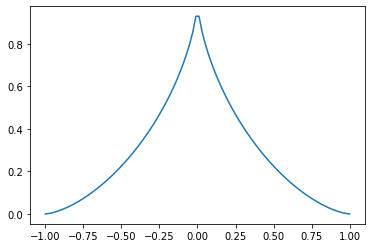

In [ ]:
r = 1.0
x = np.linspace(-1.0, 1.0, 100)
y = (r - np.abs(x)**(2/3))**(3/2)
plt.plot(x,y)

1. 4つの象限を、ひとつづきにプロットすることはできないでしょうか。(長方形を近似した時のように、パラメータ表示するとうまくいきます。[Wikipedia:Astroid](https://en.wikipedia.org/wiki/Astroid)が参考になるでしょう。)

2. 3次元のアストロイド関数も想像できます。おそらくこんな感じの式で表せる曲面は、三次元アストロイドになるのではないでしょうか。

   $$|x|^{2\over 3}+|y|^{2\over 3}+|z|^{2\over 3}=r^{2\over 3}$$
   ただし、この曲面を正確にプロットするのは難しいので、上で紹介した四次元プロットの方法を用いて、左辺の$|x|^{2\over 3}+|y|^{2\over 3}+|z|^{2\over 3}$の値の三次元等高面として描いてみて下さい。

3. [原子軌道](https://ja.wikipedia.org/wiki/水素原子におけるシュレーディンガー方程式の解#具体的な値)を4次元プロットできないでしょうか。

###問題1の解答例
長方形と同じ方法ではありませんが、三角関数を用いることで、エラーなく4事象すべてを書くことができる。  
まずは次のようなプログラムを書いてみた。

In [ ]:
r = 1.0
t = np.linspace(-3.15, 3.15, 1000)
x = r * (math.cos(t))**3
y = r * (math.sin(t))**3
plt.plot(x,y)

TypeError: ignored

エラーを出されてしまった。  
どうやらmath.の関数は行列を使うことができないようだ。  
ただ、np,でも三角関数は使えるため、こちらを使えば問題なかった。  
(尚、mathについては、三角関数について検索をかけたら最初に出たため導入した)。

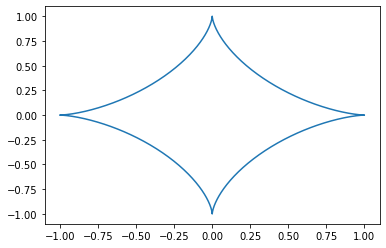

In [ ]:
r = 1.0
t = np.linspace(-3.15, 3.15, 1000)

def x(a):
  return  r * (np.cos(a))**3
def y(b):
  return  r * (np.sin(b))**3

plt.plot(x(t),y(t))

エラーの解決策を探す過程で試しに関数を定義していたが、そんなことしなくても書けた。


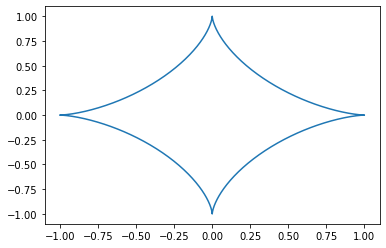

In [ ]:
r = 1.0
t = np.linspace(-3.15, 3.15, 1000)
x = r * (np.cos(t))**3
y = r * (np.sin(t))**3
plt.plot(x,y)

###問題2の解答例

In [ ]:
import numpy as np

# mgridはlinspaceの多次元版のようなもの。等間隔の数値が入ったarrayを自動生成する。
# データ間隔を指定する部分に虚数を与えると、データ個数の指定になるらしい。(わかりにくい)
X, Y, Z = np.mgrid[-1:1:20j, -1:1:20j, -1:1:20j]

D = np.abs(X)**(2/3) + np.abs(Y)**(2/3) + np.abs(Z)**(2/3)

import plotly.graph_objects as go

fig = go.Figure(data=go.Isosurface(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=D.flatten(),
    opacity=0.6,
    surface_count=10,
    caps=dict(x_show=False, y_show=False, z_show=False)
    ))
fig.show()

In [ ]:
import numpy as np

# mgridはlinspaceの多次元版のようなもの。等間隔の数値が入ったarrayを自動生成する。
# データ間隔を指定する部分に虚数を与えると、データ個数の指定になるらしい。(わかりにくい)
X, Y, Z = np.mgrid[-1:1:20j, -1:1:20j, -1:1:20j]

D = (np.abs(X)**(2/3) + np.abs(Y)**(2/3) + np.abs(Z)**(2/3))**(2/3)

import plotly.graph_objects as go

fig = go.Figure(data=go.Isosurface(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=D.flatten(),
    opacity=0.6,
    surface_count=10,
    caps=dict(x_show=False, y_show=False, z_show=False)
    ))
fig.show()

範囲を変えてみる
100×100×100にするとランタイムが切断されたので、
50 × 50 × 50 くらいが限界かもしれません。

In [ ]:
import numpy as np

# mgridはlinspaceの多次元版のようなもの。等間隔の数値が入ったarrayを自動生成する。
# データ間隔を指定する部分に虚数を与えると、データ個数の指定になるらしい。(わかりにくい)
X, Y, Z = np.mgrid[-2:2:50j, -2:2:50j, -2:2:50j]

D = np.abs(X)**(2/3) + np.abs(Y)**(2/3) + np.abs(Z)**(2/3)

import plotly.graph_objects as go

fig = go.Figure(data=go.Isosurface(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=D.flatten(),
    opacity=0.6,
    surface_count=10,
    caps=dict(x_show=False, y_show=False, z_show=False)
    ))

fig.show()

###問題3の解答例


こちらのサイトのものを全コピーしました。  
https://tsujimotter.hatenablog.com/entry/molecular-orbital-visualization#8-%E5%88%86%E5%AD%90%E8%BB%8C%E9%81%93%E3%81%AE%E5%8F%AF%E8%A6%96%E5%8C%96%E3%81%AE%E3%81%9F%E3%82%81%E3%81%AEPython%E3%83%97%E3%83%AD%E3%82%B0%E3%83%A9%E3%83%A0

自分でできる気がしない。

グリッド数: 125000, 全空間の積分: 0.7301030880207902


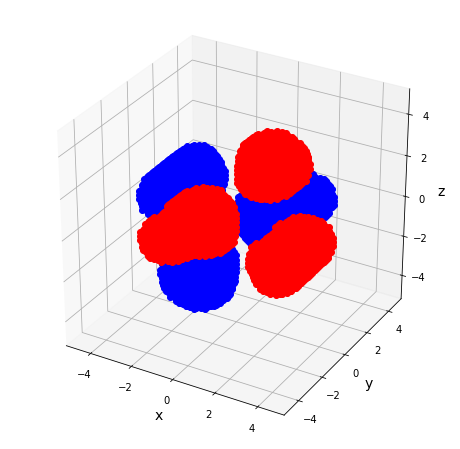

"\n# Plotlyによる可視化\nimport plotly.graph_objects as go\n\nfig = go.Figure(data=[go.Scatter3d(\n    x = X1,\n    y = Y1,\n    z = Z1,\n    mode='markers',\n    marker = dict(\n        size = 2,\n        color = 'red'\n    )\n), go.Scatter3d(\n    x = X2,\n    y = Y2,\n    z = Z2,\n    mode='markers',\n    marker = dict(\n        size = 2,\n        color = 'blue'\n    )\n)])\n\nfig.update_layout(\n    scene = dict(\n        camera=dict(eye=dict(x=1.7, y=-1.7, z=1.7)),  #eye=dict(x=1.25, y=1.25, z=1.25)), \n        xaxis = dict(range=[-x_range, x_range]),\n        yaxis = dict(range=[-x_range, x_range]),\n        zaxis = dict(range=[-x_range, x_range]),\n        aspectmode='cube', #this string can be 'data', 'cube', 'auto', 'manual'\n        #a custom aspectratio is defined as follows:\n        aspectratio=dict(x=1, y=1, z=0.95)\n    ),\n    width=800,\n    height=700,\n)\n\nfig.show()\n"

In [ ]:
# 「90%サンプリング」による分子軌道の可視化
import numpy as np
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d.axes3d as axes3d

import math


# 動径波動関数（ボーア半径を a_0 = 1 に正規化）
def radial_wave_function(r, n, l, Z_eff):
    rho = 2.0 * Z_eff * r / n
    if n == 1 and l == 0:
        return (Z_eff ** 1.5) * np.exp(-rho/2.0) * 2.0
    elif n == 2 and l == 0:
        return (Z_eff ** 1.5) * np.exp(-rho/2.0) * (2.0 - rho) / (2.0*np.sqrt(2.0))
    elif n == 2 and l == 1:
        return (Z_eff ** 1.5) * np.exp(-rho/2.0) * rho / (2.0*np.sqrt(6.0))
    elif n == 3 and l == 0:
        return (Z_eff ** 1.5) * np.exp(-rho/2.0) * (6.0 - 6.0*rho + rho**2) / (9.0*np.sqrt(3.0))
    elif n == 3 and l == 1:
        return (Z_eff ** 1.5) * np.exp(-rho/2.0) * (4.0 - rho) * rho / (9.0*np.sqrt(6.0))
    elif n == 3 and l == 2:
        return (Z_eff ** 1.5) * np.exp(-rho/2.0) * (rho**2) / (9.0*np.sqrt(30.0))


# 球面調和関数（ただし、実関数表示したもの）
def spherical_harmonics(theta, phi, l, m):
    if l == 0:
        if m == 0:
            # l=0, m=0
            return np.sqrt(1.0/(4*np.pi))
    if l == 1:
        if m == 0:
            # l=1, m=0
            return np.sqrt(3.0/(4.0*np.pi)) * np.cos(theta)
        if m == 1:
            # l=1, m=+1
            return np.sqrt(3.0/(4.0*np.pi)) * np.sin(theta) * np.cos(phi)
        if m == -1:
            # l=1, m=+1
            return np.sqrt(3.0/(4.0*np.pi)) * np.sin(theta) * np.sin(phi)
    if l == 2:
        if m == 0:
            return np.sqrt(5.0/(16.0*np.pi)) * (3.0*(np.cos(theta)**2) - 1.0)
        if m == 1:
            return np.sqrt(15.0/(4.0*np.pi)) * np.cos(theta) * np.sin(theta) * np.cos(phi)
        if m == -1:
            return np.sqrt(15.0/(4.0*np.pi)) * np.cos(theta) * np.sin(theta) * np.sin(phi)
        if m == 2:
            return np.sqrt(15.0/(16.0*np.pi)) * (np.sin(theta)**2) * np.cos(2*phi)
        if m == -2:
            return np.sqrt(15.0/(16.0*np.pi)) * (np.sin(theta)**2) * np.sin(2*phi)



# 水素原子の波動関数 Ψ_{n,l,m}(x, y, z)
def f(x, y, z, n, l, m, Z_eff):
    # 座標系を (x,y,z) -> (r,θ,φ) に変換
    r = np.sqrt(x*x + y*y + z*z)

    theta = 0.0
    phi = 0.0
    if r > 0:
        theta = np.arccos( z / r )
    if y == 0:
        if x < 0:
            phi = np.pi
    elif x*x+y*y > 0:
        phi = np.sign(y) * np.arccos(x/np.sqrt(x*x+y*y))

    # 動径波動関数と球面調和関数の積を計算して出力
    return (radial_wave_function(r, n, l, Z_eff) * spherical_harmonics(theta, phi, l, m))



# 水素分子のσ_1s軌道
def hydrogen_molecule(x, y, z, id):
    Z = 1        # 炭素原子を想定しているので Z = 1
    n = 1
    l = 0
    m = 0
    distance = 2.0  # 水素分子の原子核間距離
    if id == 0:
        # σ_1s軌道（結合性軌道）
        return (f(x-distance/2, y, z, n, l, m, Z)/np.sqrt(3.2)) + (f(x+distance/2, y, z, n, l, m, Z)/np.sqrt(3.2))
    else:
        # σ_1s*軌道（反結合性軌道）
        return (f(x-distance/2, y, z, n, l, m, Z)/np.sqrt(0.8)) - (f(x+distance/2, y, z, n, l, m, Z)/np.sqrt(0.8))



# エチレン分子のπ_2p軌道
def ethylene_molecule(x, y, z, id):
    Z = 6        # 炭素原子を想定しているので Z = 6
    Z_eff = Z - (0.35*3 + 0.85*2)  # 有効核電荷（スレータ―則により計算）
    n = 2
    l = 1
    m = 0
    distance = 133.9/52.9  # 水素原子のボーア半径 52.9 pm, エチレン分子の原子間距離 133.9 pm
    if id == 0:
        # π_2p軌道（結合性軌道）
        return (f(x-distance/2, y, z, n, l, m, Z_eff)/np.sqrt(2.0)) + (f(x+distance/2, y, z, n, l, m, Z_eff)/np.sqrt(2.0))
    else:
        # π_2p*軌道（反結合性軌道）
        return (f(x-distance/2, y, z, n, l, m, Z_eff)/np.sqrt(2.0)) - (f(x+distance/2, y, z, n, l, m, Z_eff)/np.sqrt(2.0))



# ブタジエンのπ電子共役系
# http://www.nishino-labo.jp/pdf/enshu01_03_2012.pdf （原子間距離の参考）
def butadiene_molecule(x, y, z, id):
    Z = 6        # 炭素原子を想定しているので Z = 6
    Z_eff = Z - (0.35*3 + 0.85*2)  # 有効核電荷（スレータ―則により計算）
    n = 2
    l = 1
    m = 0
    distance_1 = 147.0/52.9  # 水素原子のボーア半径 52.9 pm, C2-C3の原子間距離 147.0 pm
    distance_2 = 134.0/52.9  # 水素原子のボーア半径 52.9 pm, C1-C2, C3-C4の原子間距離 134.0 pm

    # 各炭素原子の中心座標
    center = [
        [0.5 * distance_1 * np.cos(7.0*np.pi/6.0), 0.5 * distance_1 * np.sin(7.0*np.pi/6.0) - distance_2],
        [0.5 * distance_1 * np.cos(7.0*np.pi/6.0), 0.5 * distance_1 * np.sin(7.0*np.pi/6.0)],
        [0.5 * distance_1 * np.cos(np.pi/6.0), 0.5 * distance_1 * np.sin(np.pi/6.0)],
        [0.5 * distance_1 * np.cos(np.pi/6.0), 0.5 * distance_1 * np.sin(np.pi/6.0) + distance_2],
    ]

    # 係数
    c = [
        [0.372, 0.602, 0.602, 0.372],
        [0.602, 0.372, -0.372, -0.602],
        [0.602, -0.372, -0.372, 0.602],
        [-0.372, 0.602, -0.602, 0.372],
    ]

    res = 0.0
    for i in range(4):
        x0 = x - center[i][0]
        y0 = y - center[i][1]
        res += f(x0, y0, z, n, l, m, Z_eff) * c[id][i]

    return res

# ベンゼン分子のπ電子共役系
def benzene_molecule(x, y, z, id):
    Z = 6        # 炭素原子を想定しているので Z = 6
    Z_eff = Z - (0.35*3 + 0.85*2)  # 有効核電荷（スレータ―則により計算）
    n = 2
    l = 1
    m = 0
    distance = 139/52.9  # 水素原子のボーア半径 52.9 pm, ベンゼン分子の炭素間距離 139 pm

    # 各炭素原子の中心座標
    center = []
    for i in range(6):
        cx = distance * np.sin(2*i*np.pi/6)
        cy = distance * np.cos(2*i*np.pi/6)
        center.append([cx,cy])

    # 係数
    c = [
        [1/np.sqrt(6), 1/np.sqrt(6), 1/np.sqrt(6), 1/np.sqrt(6), 1/np.sqrt(6), 1/np.sqrt(6)],
        [1/np.sqrt(3), 1/(2.0*np.sqrt(3)), -1/(2.0*np.sqrt(3)), -1/np.sqrt(3), -1/(2.0*np.sqrt(3)), 1/(2.0*np.sqrt(3))],
        [0.0, 1/2.0, 1/2.0, 0.0, -1/2.0, -1/2.0],
        [1/np.sqrt(3), -1/(2.0*np.sqrt(3)), -1/(2.0*np.sqrt(3)), 1/np.sqrt(3), -1/(2.0*np.sqrt(3)), -1/(2.0*np.sqrt(3))],
        [0.0, 1/2.0, -1/2.0, 0.0, 1/2.0, -1/2.0],
        [1/np.sqrt(6), -1/np.sqrt(6), 1/np.sqrt(6), -1/np.sqrt(6), 1/np.sqrt(6), -1/np.sqrt(6)],
    ]

    res = 0.0
    for i in range(6):
        x0 = x - center[i][0]
        y0 = y - center[i][1]
        res += f(x0, y0, z, n, l, m, Z_eff) * c[id][i]

    return res





# サンプリングの設定
N = 50                    # サンプリング個数
x_range = 5               # 座標の範囲 (-x_range, x_range)
delta = 2.0*x_range / N   # サンプリング間隔
#print(delta)


# 3次元空間を格子状にサンプリング（間隔 delta, N^3 個）
data_list = []
for i in range(N):
    for j in range(N):
        for k in range(N):
            x = i*delta - x_range
            y = j*delta - x_range
            z = k*delta - x_range






            # 座標 (x,y,z) における波動関数 Ψ(x,y,z) を計算
            # psi = hydrogen_molecule(x,y,z, 0)   # id = 0 or 1
            # psi = ethylene_molecule(x,y,z, 1)   # id = 0 or 1
            # psi = butadiene_molecule(x,y,z, 0)   # id = 0, 1, 2, 3
            psi = benzene_molecule(x,y,z, 3)   # id = 0, 1, 2, 3, 4, 5







            # 波動関数の2乗によって電子の確率密度関数 |Ψ(x,y,z)|^2 を計算
            pdf = psi**2

            # 確率密度(|Ψ(x,y,z)|^2, p.d.f), x, y, z, 波動関数の生の値 Ψ(x,y,z) の順にデータを格納
            data_list.append([pdf, x, y, z, psi])


# 確率密度が高い順にサンプリングデータをソートする
sorted_list = sorted(data_list, key=lambda data: data[0], reverse=True)  # 確率密度(p.d.f)でソート



# 波動関数が正のデータを格納する変数
x1_list = []
y1_list = []
z1_list = []

# 波動関数が負のデータを格納する変数
x2_list = []
y2_list = []
z2_list = []



# 現在考えている全体の空間（体積: (x_range)^3）における積分値を計算しておく（あとで使う）
def integral_in_all_spaces():
    integral = 0.0
    i = 0
    while i < len(sorted_list):
        pdf = sorted_list[i][0]
        psi = sorted_list[i][4]

        # |Ψ(x,y,z)|^2 ΔV を加算
        integral += (pdf * delta**3)
        i += 1
    print("グリッド数: {}, 全空間の積分: {}".format(i, integral) )
    return integral

all_integral = integral_in_all_spaces()



# |Ψ|^2 ΔV の総和( volume )が 0.9 を超えるまで足し合わせる（体積が0.9を超えたら終了）
integral = 0.0
i = 0
while integral < 0.9 * all_integral: # 全空間の積分値に対して 90 % になる領域を描画するように変更
    pdf = sorted_list[i][0]
    x = sorted_list[i][1]
    y = sorted_list[i][2]
    z = sorted_list[i][3]
    psi = sorted_list[i][4]

    # |Ψ(x,y,z)|^2 ΔV を加算
    integral += (pdf * delta**3)

    if psi > 0:
        x1_list.append(x)
        y1_list.append(y)
        z1_list.append(z)
    else:
        x2_list.append(x)
        y2_list.append(y)
        z2_list.append(z)
    i += 1



# figureを生成する
X1 = np.array(x1_list)
Y1 = np.array(y1_list)
Z1 = np.array(z1_list)

X2 = np.array(x2_list)
Y2 = np.array(y2_list)
Z2 = np.array(z2_list)



#'''
# matplotlibによる可視化
fig = plt.figure(figsize=(8.0, 8.0))
ax = fig.add_subplot(1,1,1, projection='3d')

ax.set_xlim3d(-x_range, x_range)
ax.set_ylim3d(-x_range, x_range)
ax.set_zlim3d(-x_range, x_range)

# 軸の設定
ax.set_xlabel("x", size = 14)
ax.set_ylabel("y", size = 14)
ax.set_zlabel("z", size = 14)

ax.plot(X2,Y2,Z2,color='b',marker="o",linestyle='None')
ax.plot(X1,Y1,Z1,color='r',marker="o",linestyle='None')

plt.show()
#'''



'''
# Plotlyによる可視化
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(
    x = X1,
    y = Y1,
    z = Z1,
    mode='markers',
    marker = dict(
        size = 2,
        color = 'red'
    )
), go.Scatter3d(
    x = X2,
    y = Y2,
    z = Z2,
    mode='markers',
    marker = dict(
        size = 2,
        color = 'blue'
    )
)])

fig.update_layout(
    scene = dict(
        camera=dict(eye=dict(x=1.7, y=-1.7, z=1.7)),  #eye=dict(x=1.25, y=1.25, z=1.25)),
        xaxis = dict(range=[-x_range, x_range]),
        yaxis = dict(range=[-x_range, x_range]),
        zaxis = dict(range=[-x_range, x_range]),
        aspectmode='cube', #this string can be 'data', 'cube', 'auto', 'manual'
        #a custom aspectratio is defined as follows:
        aspectratio=dict(x=1, y=1, z=0.95)
    ),
    width=800,
    height=700,
)

fig.show()
'''

プログラム内の次の箇所を変えると（コメントアウトを変更すると）、表示する分子軌道の種類を変えることができます。（デフォルトはベンゼンの Ψ1 軌道。）
→id = 5に書き換えています。

In [ ]:
  # 座標 (x,y,z) における波動関数 Ψ(x,y,z) を計算
            # psi = hydrogen_molecule(x,y,z, 0)   # id = 0 or 1
            # psi = ethylene_molecule(x,y,z, 1)   # id = 0 or 1
            # psi = butadiene_molecule(x,y,z, 0)   # id = 0, 1, 2, 3
            psi = benzene_molecule(x,y,z, 0)   # id = 0, 1, 2, 3, 4, 5

また、デフォルトでは、matplotlibで描画するようになっていますが、matplotlibの箇所をコメントアウトして、コメントアウトされているplotlyの箇所を戻せばplotlyで可視化できます。（plotlyを使用する際には、plotlyのインストールが別途必要です。）

というわけで、plotlyでもやってみました。

In [ ]:
# 「90%サンプリング」による分子軌道の可視化
import numpy as np
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d.axes3d as axes3d

import math


# 動径波動関数（ボーア半径を a_0 = 1 に正規化）
def radial_wave_function(r, n, l, Z_eff):
    rho = 2.0 * Z_eff * r / n
    if n == 1 and l == 0:
        return (Z_eff ** 1.5) * np.exp(-rho/2.0) * 2.0
    elif n == 2 and l == 0:
        return (Z_eff ** 1.5) * np.exp(-rho/2.0) * (2.0 - rho) / (2.0*np.sqrt(2.0))
    elif n == 2 and l == 1:
        return (Z_eff ** 1.5) * np.exp(-rho/2.0) * rho / (2.0*np.sqrt(6.0))
    elif n == 3 and l == 0:
        return (Z_eff ** 1.5) * np.exp(-rho/2.0) * (6.0 - 6.0*rho + rho**2) / (9.0*np.sqrt(3.0))
    elif n == 3 and l == 1:
        return (Z_eff ** 1.5) * np.exp(-rho/2.0) * (4.0 - rho) * rho / (9.0*np.sqrt(6.0))
    elif n == 3 and l == 2:
        return (Z_eff ** 1.5) * np.exp(-rho/2.0) * (rho**2) / (9.0*np.sqrt(30.0))


# 球面調和関数（ただし、実関数表示したもの）
def spherical_harmonics(theta, phi, l, m):
    if l == 0:
        if m == 0:
            # l=0, m=0
            return np.sqrt(1.0/(4*np.pi))
    if l == 1:
        if m == 0:
            # l=1, m=0
            return np.sqrt(3.0/(4.0*np.pi)) * np.cos(theta)
        if m == 1:
            # l=1, m=+1
            return np.sqrt(3.0/(4.0*np.pi)) * np.sin(theta) * np.cos(phi)
        if m == -1:
            # l=1, m=+1
            return np.sqrt(3.0/(4.0*np.pi)) * np.sin(theta) * np.sin(phi)
    if l == 2:
        if m == 0:
            return np.sqrt(5.0/(16.0*np.pi)) * (3.0*(np.cos(theta)**2) - 1.0)
        if m == 1:
            return np.sqrt(15.0/(4.0*np.pi)) * np.cos(theta) * np.sin(theta) * np.cos(phi)
        if m == -1:
            return np.sqrt(15.0/(4.0*np.pi)) * np.cos(theta) * np.sin(theta) * np.sin(phi)
        if m == 2:
            return np.sqrt(15.0/(16.0*np.pi)) * (np.sin(theta)**2) * np.cos(2*phi)
        if m == -2:
            return np.sqrt(15.0/(16.0*np.pi)) * (np.sin(theta)**2) * np.sin(2*phi)



# 水素原子の波動関数 Ψ_{n,l,m}(x, y, z)
def f(x, y, z, n, l, m, Z_eff):
    # 座標系を (x,y,z) -> (r,θ,φ) に変換
    r = np.sqrt(x*x + y*y + z*z)

    theta = 0.0
    phi = 0.0
    if r > 0:
        theta = np.arccos( z / r )
    if y == 0:
        if x < 0:
            phi = np.pi
    elif x*x+y*y > 0:
        phi = np.sign(y) * np.arccos(x/np.sqrt(x*x+y*y))

    # 動径波動関数と球面調和関数の積を計算して出力
    return (radial_wave_function(r, n, l, Z_eff) * spherical_harmonics(theta, phi, l, m))



# 水素分子のσ_1s軌道
def hydrogen_molecule(x, y, z, id):
    Z = 1        # 炭素原子を想定しているので Z = 1
    n = 1
    l = 0
    m = 0
    distance = 2.0  # 水素分子の原子核間距離
    if id == 0:
        # σ_1s軌道（結合性軌道）
        return (f(x-distance/2, y, z, n, l, m, Z)/np.sqrt(3.2)) + (f(x+distance/2, y, z, n, l, m, Z)/np.sqrt(3.2))
    else:
        # σ_1s*軌道（反結合性軌道）
        return (f(x-distance/2, y, z, n, l, m, Z)/np.sqrt(0.8)) - (f(x+distance/2, y, z, n, l, m, Z)/np.sqrt(0.8))



# エチレン分子のπ_2p軌道
def ethylene_molecule(x, y, z, id):
    Z = 6        # 炭素原子を想定しているので Z = 6
    Z_eff = Z - (0.35*3 + 0.85*2)  # 有効核電荷（スレータ―則により計算）
    n = 2
    l = 1
    m = 0
    distance = 133.9/52.9  # 水素原子のボーア半径 52.9 pm, エチレン分子の原子間距離 133.9 pm
    if id == 0:
        # π_2p軌道（結合性軌道）
        return (f(x-distance/2, y, z, n, l, m, Z_eff)/np.sqrt(2.0)) + (f(x+distance/2, y, z, n, l, m, Z_eff)/np.sqrt(2.0))
    else:
        # π_2p*軌道（反結合性軌道）
        return (f(x-distance/2, y, z, n, l, m, Z_eff)/np.sqrt(2.0)) - (f(x+distance/2, y, z, n, l, m, Z_eff)/np.sqrt(2.0))



# ブタジエンのπ電子共役系
# http://www.nishino-labo.jp/pdf/enshu01_03_2012.pdf （原子間距離の参考）
def butadiene_molecule(x, y, z, id):
    Z = 6        # 炭素原子を想定しているので Z = 6
    Z_eff = Z - (0.35*3 + 0.85*2)  # 有効核電荷（スレータ―則により計算）
    n = 2
    l = 1
    m = 0
    distance_1 = 147.0/52.9  # 水素原子のボーア半径 52.9 pm, C2-C3の原子間距離 147.0 pm
    distance_2 = 134.0/52.9  # 水素原子のボーア半径 52.9 pm, C1-C2, C3-C4の原子間距離 134.0 pm

    # 各炭素原子の中心座標
    center = [
        [0.5 * distance_1 * np.cos(7.0*np.pi/6.0), 0.5 * distance_1 * np.sin(7.0*np.pi/6.0) - distance_2],
        [0.5 * distance_1 * np.cos(7.0*np.pi/6.0), 0.5 * distance_1 * np.sin(7.0*np.pi/6.0)],
        [0.5 * distance_1 * np.cos(np.pi/6.0), 0.5 * distance_1 * np.sin(np.pi/6.0)],
        [0.5 * distance_1 * np.cos(np.pi/6.0), 0.5 * distance_1 * np.sin(np.pi/6.0) + distance_2],
    ]

    # 係数
    c = [
        [0.372, 0.602, 0.602, 0.372],
        [0.602, 0.372, -0.372, -0.602],
        [0.602, -0.372, -0.372, 0.602],
        [-0.372, 0.602, -0.602, 0.372],
    ]

    res = 0.0
    for i in range(4):
        x0 = x - center[i][0]
        y0 = y - center[i][1]
        res += f(x0, y0, z, n, l, m, Z_eff) * c[id][i]

    return res

# ベンゼン分子のπ電子共役系
def benzene_molecule(x, y, z, id):
    Z = 6        # 炭素原子を想定しているので Z = 6
    Z_eff = Z - (0.35*3 + 0.85*2)  # 有効核電荷（スレータ―則により計算）
    n = 2
    l = 1
    m = 0
    distance = 139/52.9  # 水素原子のボーア半径 52.9 pm, ベンゼン分子の炭素間距離 139 pm

    # 各炭素原子の中心座標
    center = []
    for i in range(6):
        cx = distance * np.sin(2*i*np.pi/6)
        cy = distance * np.cos(2*i*np.pi/6)
        center.append([cx,cy])

    # 係数
    c = [
        [1/np.sqrt(6), 1/np.sqrt(6), 1/np.sqrt(6), 1/np.sqrt(6), 1/np.sqrt(6), 1/np.sqrt(6)],
        [1/np.sqrt(3), 1/(2.0*np.sqrt(3)), -1/(2.0*np.sqrt(3)), -1/np.sqrt(3), -1/(2.0*np.sqrt(3)), 1/(2.0*np.sqrt(3))],
        [0.0, 1/2.0, 1/2.0, 0.0, -1/2.0, -1/2.0],
        [1/np.sqrt(3), -1/(2.0*np.sqrt(3)), -1/(2.0*np.sqrt(3)), 1/np.sqrt(3), -1/(2.0*np.sqrt(3)), -1/(2.0*np.sqrt(3))],
        [0.0, 1/2.0, -1/2.0, 0.0, 1/2.0, -1/2.0],
        [1/np.sqrt(6), -1/np.sqrt(6), 1/np.sqrt(6), -1/np.sqrt(6), 1/np.sqrt(6), -1/np.sqrt(6)],
    ]

    res = 0.0
    for i in range(6):
        x0 = x - center[i][0]
        y0 = y - center[i][1]
        res += f(x0, y0, z, n, l, m, Z_eff) * c[id][i]

    return res





# サンプリングの設定
N = 50                    # サンプリング個数
x_range = 5               # 座標の範囲 (-x_range, x_range)
delta = 2.0*x_range / N   # サンプリング間隔
#print(delta)


# 3次元空間を格子状にサンプリング（間隔 delta, N^3 個）
data_list = []
for i in range(N):
    for j in range(N):
        for k in range(N):
            x = i*delta - x_range
            y = j*delta - x_range
            z = k*delta - x_range






            # 座標 (x,y,z) における波動関数 Ψ(x,y,z) を計算
            # psi = hydrogen_molecule(x,y,z, 0)   # id = 0 or 1
            # psi = ethylene_molecule(x,y,z, 1)   # id = 0 or 1
            # psi = butadiene_molecule(x,y,z, 0)   # id = 0, 1, 2, 3
            psi = benzene_molecule(x,y,z, 5)   # id = 0, 1, 2, 3, 4, 5







            # 波動関数の2乗によって電子の確率密度関数 |Ψ(x,y,z)|^2 を計算
            pdf = psi**2

            # 確率密度(|Ψ(x,y,z)|^2, p.d.f), x, y, z, 波動関数の生の値 Ψ(x,y,z) の順にデータを格納
            data_list.append([pdf, x, y, z, psi])


# 確率密度が高い順にサンプリングデータをソートする
sorted_list = sorted(data_list, key=lambda data: data[0], reverse=True)  # 確率密度(p.d.f)でソート



# 波動関数が正のデータを格納する変数
x1_list = []
y1_list = []
z1_list = []

# 波動関数が負のデータを格納する変数
x2_list = []
y2_list = []
z2_list = []



# 現在考えている全体の空間（体積: (x_range)^3）における積分値を計算しておく（あとで使う）
def integral_in_all_spaces():
    integral = 0.0
    i = 0
    while i < len(sorted_list):
        pdf = sorted_list[i][0]
        psi = sorted_list[i][4]

        # |Ψ(x,y,z)|^2 ΔV を加算
        integral += (pdf * delta**3)
        i += 1
    print("グリッド数: {}, 全空間の積分: {}".format(i, integral) )
    return integral

all_integral = integral_in_all_spaces()



# |Ψ|^2 ΔV の総和( volume )が 0.9 を超えるまで足し合わせる（体積が0.9を超えたら終了）
integral = 0.0
i = 0
while integral < 0.9 * all_integral: # 全空間の積分値に対して 90 % になる領域を描画するように変更
    pdf = sorted_list[i][0]
    x = sorted_list[i][1]
    y = sorted_list[i][2]
    z = sorted_list[i][3]
    psi = sorted_list[i][4]

    # |Ψ(x,y,z)|^2 ΔV を加算
    integral += (pdf * delta**3)

    if psi > 0:
        x1_list.append(x)
        y1_list.append(y)
        z1_list.append(z)
    else:
        x2_list.append(x)
        y2_list.append(y)
        z2_list.append(z)
    i += 1



# figureを生成する
X1 = np.array(x1_list)
Y1 = np.array(y1_list)
Z1 = np.array(z1_list)

X2 = np.array(x2_list)
Y2 = np.array(y2_list)
Z2 = np.array(z2_list)



'''
# matplotlibによる可視化
fig = plt.figure(figsize=(8.0, 8.0))
ax = fig.add_subplot(1,1,1, projection='3d')

ax.set_xlim3d(-x_range, x_range)
ax.set_ylim3d(-x_range, x_range)
ax.set_zlim3d(-x_range, x_range)

# 軸の設定
ax.set_xlabel("x", size = 14)
ax.set_ylabel("y", size = 14)
ax.set_zlabel("z", size = 14)

ax.plot(X2,Y2,Z2,color='b',marker="o",linestyle='None')
ax.plot(X1,Y1,Z1,color='r',marker="o",linestyle='None')

plt.show()
'''



#'''
# Plotlyによる可視化
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(
    x = X1,
    y = Y1,
    z = Z1,
    mode='markers',
    marker = dict(
        size = 2,
        color = 'red'
    )
), go.Scatter3d(
    x = X2,
    y = Y2,
    z = Z2,
    mode='markers',
    marker = dict(
        size = 2,
        color = 'blue'
    )
)])

fig.update_layout(
    scene = dict(
        camera=dict(eye=dict(x=1.7, y=-1.7, z=1.7)),  #eye=dict(x=1.25, y=1.25, z=1.25)),
        xaxis = dict(range=[-x_range, x_range]),
        yaxis = dict(range=[-x_range, x_range]),
        zaxis = dict(range=[-x_range, x_range]),
        aspectmode='cube', #this string can be 'data', 'cube', 'auto', 'manual'
        #a custom aspectratio is defined as follows:
        aspectratio=dict(x=1, y=1, z=0.95)
    ),
    width=800,
    height=700,
)

fig.show()
#'''

グリッド数: 125000, 全空間の積分: 0.5570556936905464


他にはこちらのサイトもありました。  
http://uniny.seesaa.net/article/422249544.html  
こちらは具体的な分子でなく、一般的なプロットができるっぽい。
ちょっとエラー？が出てますし、外れ値みたいなのが出てしまっていますが、  
それっぽいものは描けました。
サイトの方では外れ値みたいなのがないので、インデントなどが少し違うのかもしれません。

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning:

No contour levels were found within the data range.

/usr/local/lib/python3.7/dist-packages/mpl_toolkits/mplot3d/art3d.py:304: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: UserWarning:

No contour levels were found within the data range.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: UserWarning:

No contour levels were found within the data range.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: UserWarning:

No contour levels were found within the data range.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: UserWarning:

No contour levels were found within the data range.

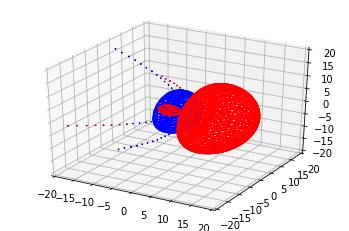

In [ ]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
import numpy as np

def plot_implicit(fn, bbox=(-20,20)): # bbox .. x,y,z軸の表示範囲

  xmin, xmax, ymin, ymax, zmin, zmax = bbox*3
  fig = plt.figure()
  ax = fig.add_subplot(111, projection='3d')

  A = np.linspace(xmin, xmax, 200) # 等高面の解像度
  B = np.linspace(xmin, xmax, 40) # 切断面の数
  A1,A2 = np.meshgrid(A,A) # 等高線がプロットされる切断面上の格子

  psi = 0.01 # 波動関数の絶対値

  #psi > 0 の部分
  for z in B: # XY平面に平行な面上の等高線
    X,Y = A1,A2
    Z = fn(X,Y,z) - psi
    cset = ax.contour(X, Y, Z+z, [z], zdir='z', colors='red', linestyles='-')

  for y in B: # XZ平面に平行な面上の等高線
    X,Z = A1,A2
    Y = fn(X,y,Z) - psi
    cset = ax.contour(X, Y+y, Z, [y], zdir='y', colors='red', linestyles='-')

  for x in B: # YZ平面に平行な面上の等高線
    Y,Z = A1,A2
    X = fn(x,Y,Z) - psi
    cset = ax.contour(X+x, Y, Z, [x], zdir='x', colors='red', linestyles='-')

  #psi < 0 の部分
  for z in B:
    X,Y = A1,A2
    Z = fn(X,Y,z) + psi
    cset = ax.contour(X, Y, Z+z, [z], zdir='z', colors='blue', linestyles='-')

  for y in B:
    X,Z = A1,A2
    Y = fn(X,y,Z) + psi
    cset = ax.contour(X, Y+y, Z, [y], zdir='y', colors='blue', linestyles='-')

  for x in B:
    Y,Z = A1,A2
    X = fn(x,Y,Z) + psi
    cset = ax.contour(X+x, Y, Z, [x], zdir='x', colors='blue', linestyles='-')

  ax.set_zlim3d(zmin,zmax)
  ax.set_xlim3d(xmin,xmax)
  ax.set_ylim3d(ymin,ymax)

  plt.show()

#球座標
def r(x,y,z):
  return np.sqrt(x**2+y**2+z**2)

def theta(x,y,z):
  return np.arccos(z/r(x,y,z))

def phi(x,y,z):
  return np.arctan2(y,x)

#原子軌道(a0=1,Z=1)
def n1s(x,y,z):
  return np.exp(-r(x,y,z))/np.sqrt(np.pi)

def n2s(x,y,z):
  return np.exp(-r(x,y,z)/2)*(2-r(x,y,z))/4/np.sqrt(2*np.pi)

def n2pz(x,y,z):
  return r(x,y,z)*np.exp(-r(x,y,z)/2)*np.cos(theta(x,y,z))/4/np.sqrt(2*np.pi)
def n2px(x,y,z):
  return r(x,y,z)*np.exp(-r(x,y,z)/2)*np.sin(theta(x,y,z))*np.cos(phi(x,y,z))/4/np.sqrt(2*np.pi)
def n2py(x,y,z):
  return r(x,y,z)*np.exp(-r(x,y,z)/2)*np.sin(theta(x,y,z))*np.sin(phi(x,y,z))/4/np.sqrt(2*np.pi)

def n3s(x,y,z):
  return 2*(17-18*r(x,y,z)+2*r(x,y,z)**2)*np.exp(-r(x,y,z)/3)/81/np.sqrt(3*np.pi)

def n3pz(x,y,z):
  return 2*(6*r(x,y,z)-r(x,y,z)**2)*np.exp(-r(x,y,z)/3)*np.cos(theta(x,y,z))/81/np.sqrt(np.pi)
def n3px(x,y,z):
  return 2*(6*r(x,y,z)-r(x,y,z)**2)*np.exp(-r(x,y,z)/3)*np.sin(theta(x,y,z))*np.cos(phi(x,y,z))/81/np.sqrt(np.pi)
def n3py(x,y,z):
  return 2*(6*r(x,y,z)-r(x,y,z)**2)*np.exp(-r(x,y,z)/3)*np.sin(theta(x,y,z))*np.cos(phi(x,y,z))/81/np.sqrt(np.pi)

def n3dz2(x,y,z):
  return r(x,y,z)**2*np.exp(-r(x,y,z)/3)*(np.sqrt(3)*np.cos(theta(x,y,z))**2-1/np.sqrt(3))/81/np.sqrt(2*np.pi)
def n3dzx(x,y,z):
  return r(x,y,z)**2*np.exp(-r(x,y,z)/3)*np.sin(2*theta(x,y,z))*np.cos(phi(x,y,z))/81/np.sqrt(2*np.pi)
def n3dyz(x,y,z):
  return r(x,y,z)**2*np.exp(-r(x,y,z)/3)*np.sin(2*theta(x,y,z))*np.sin(phi(x,y,z))/81/np.sqrt(2*np.pi)
def n3dxy(x,y,z):
  return r(x,y,z)**2*np.exp(-r(x,y,z)/3)*np.sin(theta(x,y,z))**2*np.sin(2*phi(x,y,z))/81/np.sqrt(2*np.pi)
def n3dx2my2(x,y,z):
  return r(x,y,z)**2*np.exp(-r(x,y,z)/3)*np.sin(theta(x,y,z))**2*np.cos(2*phi(x,y,z))/81/np.sqrt(2*np.pi)

#表示する軌道の指定
def orb(x,y,z):
  return n3s(x,y,z)/np.sqrt(6)-n3px(x,y,z)/np.sqrt(2)-n3dz2(x,y,z)/np.sqrt(12)+n3dx2my2(x,y,z)/np.sqrt(4) #sp3d2混成軌道

plot_implicit(orb)